# Lab 2: The Shape of a Bending Beam

What is the shape of a bent beam? This is perhaps one of the oldest and most important questions in all of mechanics. It attracted the attention of some of the greatest minds in mathematics, including Galileo, the Bernoullis, and Euler. It's shape is useful in the design of engineering structures, [shipbuilding](https://www.marineinsight.com/naval-architecture/ship-construction-plate-machining-assembly-hull-units-block-erection/), creating [flexible electronic devices](https://matmatch.com/blog/flexible-electronics-world/), modelling and [animating hair](https://disney-animation.s3.amazonaws.com/uploads/production/publication_asset/167/asset/moanaHair_abstract1.pdf) in Disney movies, describing the shape of a [meniscus and a fluid droplet](https://www.fmf.uni-lj.si/~podgornik/download/Analogies-drop-elastica.pdf), and in laying [transatlantic communication cables](https://www.mdpi.com/2077-1312/8/1/48/pdf), among countless other examples. For a detailed look at the history of elastica, the curious reader may enjoy [this article](https://www.levien.com/phd/elastica_hist.pdf).

Remarkably, the shape of a thin strip of elastic material - an <i>elastica</i> in Latin - is given by same differential equation that describes a pendulum,
\begin{equation}
\frac{d^2\theta(s)}{ds^2} + \lambda \sin[\theta(s)] = 0,
\tag{1}
\end{equation}
    where $s$ is the location along the <i>elastica</i>, $\theta(s)$ is the angle or slope of the <i>elastica</i> at a given location $s$, that is $\theta(s)=dw/ds$ where $w$ is the vertical deflection, and $\lambda$ is the magnitude of applied force to the bending rigidity of the <i>elastica</i>. If we can solve equation (1) for $\theta(s)$, we will know the shape of a bent bend under what load parameter $\lambda$ that we apply. 
    
However, equation (1) is very difficult to solve. It is difficult because it is <b>nonlinear</b>, and it is nonlinear because of the $\sin[\theta(s)]$ term. When the slopes of the beam are small, we know from the small angle approximation (or, more formally from a Taylor series expansion) that $\sin[\theta(s)]\approx \theta(s)$ <i>et voila</i> the equation is no longer nonlinear. We a little bit of work, we can manipulate this linear equation into the equation you are more familiar with, the equation of an elastic curve
\begin{equation}
EI \frac{d^4w}{dx^4}=q(x),
\tag{2}
\end{equation}
where $EI$ is the bending or flexural rigidity where $E$ is Young's elastic modulus, $I$ is the [second moment of area](https://en.wikipedia.org/wiki/Second_moment_of_area), and $q(x)$ is the distributed load acting transverse or orthogonal to the beam's neutral axis - it has units of force per unit length. Here, I have assumed that $E$ and $I$ do not change along the $x$ axis of the beam, otherwise equation (2) becomes a bit more complicated. You may be wondering why we're now taking derivatives with respect to $x$, which is the Cartesean coordinate running along the beam's neutral axis when the beam is <b>undeformed</b>, rather than $s$, which is a coordinate running along the neutral axis of the <b>deformed</b>, or bent, beam. The reason we can use the <b>undeformed</b> configuration, and thus take derivatives with respect to $x$, is because we assumed the <b>slope of the beam is small</b>, and this means that $s\approx x$. Because this fourth-order [ordinary differential equation](https://en.wikipedia.org/wiki/Ordinary_differential_equation) is <b>linear</b> (remember, we are assuming the beam is bent, but not too much), it is straightforward to solve.

In [1]:
install_mpld3 = !pip install "git+https://github.com/mpld3/mpld3" 
import math         # sine, cosine, sqrt, etc.
import numpy as np  # so we can work with matrices
import pandas as pd               # for data/tables

import matplotlib
import matplotlib.pyplot as plt # plotting

from skimage import io            # working with images
from IPython.display import Image,display # images in colab
import mpld3                      # interacting with images
from mpld3 import plugins         # getting pixel data from images

## Experiments

1. Find a ruler or a similarly shaped object.

2. Cantilever the beam, i.e. impose clamped-free boundary conditions. For example, you can place one end underneath heavy books, duct tape it to a table, etc. Let the other end hang freely.

 <u> Part 1: Fixed location of point load, varied load magnitude. </u>

3. Measure and record $L$, the distance between your clamp and the end of the beam. 

4. Add mass to the end of the beam by hanging or resting weights. Record the mass.

5. You need a reference object in the frame. This can be the same object as your mass or something like a thumb tack. Measure it and place it near the location of your mass.

6. Take a photo ensuring that your camera view is at eye level with and perpendicular to the beam. 

7. Repeat steps 4 through 6 four to six times for different masses, for a total of 5-7 photos.

 <u> Part 2: Fixed load magnitude, varied location of point load.</u>

8. Choose one of your mass values (record it) and move it from the end of the beam to some other spot along x. Record the new position.

9. Take a photo.

10. Repeat steps 8 through 9 three times for the same mass, so you have photos for a total of 5 positions (including at the end, $x=L$, from Part 1). 

11. Add all images (descriptively named) to your shared Google drive.

<a href="https://ibb.co/vkchQJM"><img src="https://i.ibb.co/CQw6MnS/cantilever-ex2.jpg" alt="cantilever-ex2" border="0" /></a>

Note that if your beam deflects more than the example image above, it's probably beyond the small slope approximation.

## Parameters and initializing lists

Edit the next cell with the value of Young's Modulus E for your beam (Google it and do your best), the second moment of area I (calculate it), and the length from clamp to the end of the beam L.

In [16]:
### Edit me
E = 35*10**9 # Pa
I = 
L = 0.247 # m
 
    d = 3.175mm

Initialize lists where you'll record measurements (you don't need to edit this.) 

In [17]:
F_list = [0]
wL_list = [0] 

## Image Processing for Part 1

Mount your shared Google Drive. Run & repeat the next two cells for all of your images from Part 1 of the experiments, where you varied the magnitude of the load. This will store your measurements in the lists we initialized above.

In [20]:
# Repeat for each of your photos
path = str(input("Paste or type your file path: "))
im = io.imread(path)

fig, ax = plt.subplots(figsize=(7,7))
io.imshow(im)
plugins.connect(fig, plugins.MousePosition(fontsize=14))
mpld3.display()

Paste or type your file path: cantilever_ex_small.jpg


In [21]:
# Conversion factor
ref_mm = float(input("Enter the length of the reference object in mm: "))
ref_pixels = float(input("Enter the length of the reference object in pixels (px): "))
pix_to_m = ref_mm/(ref_pixels*1000)

# Force
m = float(input("Enter the applied mass (g): "))/1000 #kg
F = m*-9.81 # N = kg*m/s^2

# Deflection
wL_pix = float(input("Enter the y-deflection at L in pixels: "))
wL_m = wL_pix*pix_to_m

F_list.append(F)
wL_list.append(wL_m)

Enter the length of the reference object in pixels (px): 5
Enter the applied mass (g): 130
Enter the y-deflection at L in pixels: 10


Make a dataframe from these lists

In [57]:
# Make a df
E_list = E*np.ones_like(F_list)
I_list = I*np.ones_like(F_list)
L_list = L/1000*np.ones_like(F_list)
xL_list = L_list

d1 = {'E':E_list, 'I':I_list, 'P':F_list, 'L':L_list, 'xL':xL_list, 'wL_measured':wL_list}
df1 = pd.DataFrame(d1)

## Results for Part 1

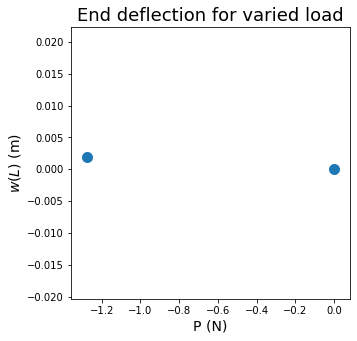

In [56]:
fig,ax=plt.subplots(figsize=(5,5))
df1.plot.scatter('P','wL_measured',s=100,ax=ax)
ax.set_xlabel('P (N)',size=14)
ax.set_ylabel('$w(L)$ (m)',size=14)
ax.set_title('End deflection for varied load',size=18)
plt.show()
## How is your data? Clear trend? Scattered? Maybe retake measurements. 

## Image Processing for Part 2

Edit the force (use Newtons) which you held constant for Part 2, and initialize lists where you'll record measurements.

In [72]:
F = 1 # N -- edit me
wL_list_2 = [0] 
xL_list_2 = [0]

Run & repeat the next two cells for all of your images from Part 2 of the experiments, where you varied the location of the load. This will store your measurements in the lists we initialized above.

In [20]:
# Repeat for each of your photos
path = str(input("Paste or type your file path: "))
im = io.imread(path)

fig, ax = plt.subplots(figsize=(7,7))
io.imshow(im)
plugins.connect(fig, plugins.MousePosition(fontsize=14))
mpld3.display()

Paste or type your file path: cantilever_ex_small.jpg


In [75]:
# Conversion factor
ref_mm = float(input("Enter the length of the reference object in mm: "))
ref_pixels = float(input("Enter the length of the reference object in pixels (px): "))
pix_to_m = ref_mm/(ref_pixels*1000)

# Loading position
xL = float(input("Enter the x-location of loading (mm): "))/1000 # m

# Deflection
wL_pix = float(input("Enter the y-deflection at L in pixels: "))
wL_m = wL_pix*pix_to_m

xL_list_2.append(xL)
wL_list_2.append(wL_m)

Enter the length of the reference object in mm: 5
Enter the length of the reference object in pixels (px): 5
Enter the x-location of loading (mm): 10
Enter the y-deflection at L in pixels: 8


Make a dataframe from these lists

In [76]:
# Make a df
E_list_2 = E*np.ones_like(wL_list_2)
I_list_2 = I*np.ones_like(wL_list_2)
L_list_2 = L*np.ones_like(wL_list_2)
F_list_2 = F*np.ones_like(wL_list_2)

d2 = {'E':E_list_2, 'I':I_list_2, 'P':F_list_2, 'L':L_list_2, 'xL':xL_list_2, 'wL_measured':wL_list_2}
df2 = pd.DataFrame(d2)

## Results for Part 2

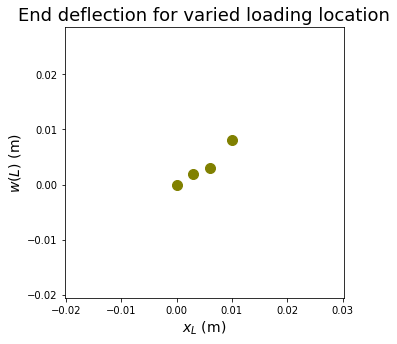

In [86]:
fig,ax=plt.subplots(figsize=(5,5))
df2.plot.scatter('xL','wL_measured',s=100,c='olive',ax=ax)
ax.set_xlabel('$x_L$ (m)',size=14)
ax.set_ylabel('$w(L)$ (m)',size=14)
ax.set_title('End deflection for varied loading location',size=18)
plt.show()
## How is your data? Clear trend? Scattered? Maybe retake measurements. 

## Analysis

Solve the beam equation for this specific loading. Input x=L to get the solution at the end of the beam. Plot this with their data.

In [79]:
### FIXME: Don't give them this but show them how to do DF manipulations

df1['wL_theory'] = -(df1.P*df1.L**3)/(3*df1.E*df1.I)
df2['wL_theory'] = -(df2.P*df1.L**2)/(2*df2.E*df2.I)*(df2.xL-df2.L/3) # note it's the same if wL = L

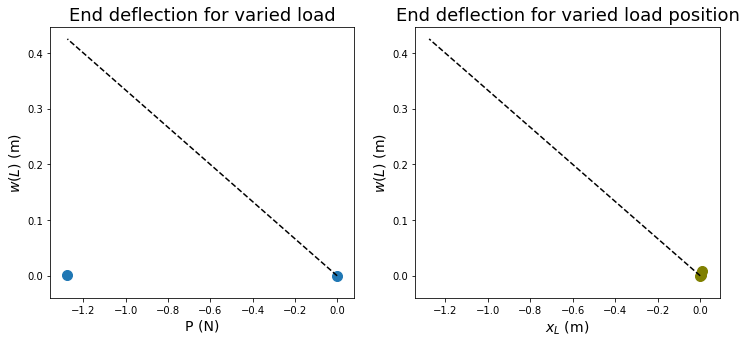

In [85]:
fig,ax=plt.subplots(1,2, figsize=(12,5))

df1.plot.scatter('P','wL_measured',s=100,ax=ax[0])
ax[0].plot(df.P,df.wL_theory,'k--')
ax[0].set_xlabel('P (N)',size=14)
ax[0].set_ylabel('$w(L)$ (m)',size=14)
ax[0].set_title('End deflection for varied load',size=18)

df2.plot.scatter('xL','wL_measured',s=100,c='olive',ax=ax[1])
ax[1].plot(df.P,df.wL_theory,'k--')
ax[1].set_xlabel('$x_L$ (m)',size=14)
ax[1].set_ylabel('$w(L)$ (m)',size=14)
ax[1].set_title('End deflection for varied load position',size=18)

plt.show()

In [ ]:
## Plot together??? Or plot dependence of some other parameter?? 

(6) <b>Would it be fun/easy to have them plot w(x) vs. x for a particular load, and overlay this on one of their images?</b>

## Discussion

(5) Discussion should be similar to the last lab. Here, are assumptions are small strains (Hooke's law), but perhaps more importantly small slopes (these are not the same). How does EB theory compare for all of their loads? Do they stay in the "small slope" regime, or do they notice where their data starts to deviate? <b>Is it worth the hassle of having them also plot circles and parabolas to show the results are not the same? Maybe not...</b>

Does (2) reduce to (1)

Is (2) if you got the deflection at xL equivalent to end deflection of a beam length xL 

<a id='mass'></a>
## Appendix A: Masses of Various Objects

| Object | Mass (g) | Diameter (mm) | Height (mm) |
| --- | --- | --- | --- |
| Dime | 2 | 17.9 | 1.35 |
| Penny | 3 | 19.1 | 1.52 |
| Nickel | 5 | 21.2 | 1.95 |
| Quarter | 5.6 | 24.3 | 1.75 |
| AAA Battery | 11 | 10.5 | 44.5 |
| AA Battery | 24 | 14.5 | 50.5 |
| 9V Battery | 45 | n/a  | 48.5  |
| C Battery | 67 | 26.2 | 50.0 |
| D Battery | 136 | 34.2 | 61.5 |